<a href="https://colab.research.google.com/github/pjcroxas/Data-Science-Experiments/blob/master/Cluster_Analysis_of_GPS_Data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

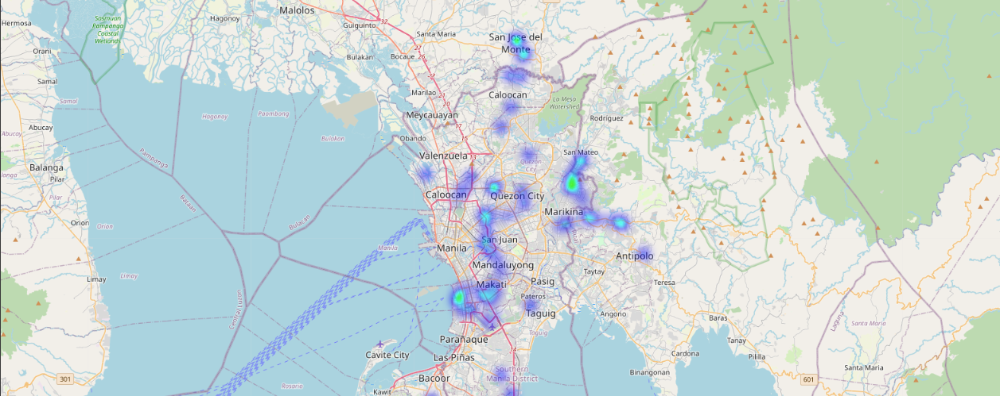

Global Positioning System (GPS) data has become a valuable source of information in mobility planning, transportation, and logistics in recent years. With the increasing use of GPS-enabled devices, vast amounts of location data are being generated every day. This data can be harnessed through data science techniques to gain insights into mobility patterns, such as the frequency and duration of trips, the most commonly used routes, and the modes of transportation used. This information can be used to improve transportation systems, optimize logistics operations, and enhance mobility planning. By analyzing GPS data, decision-makers can make more informed decisions to improve transportation efficiency, reduce congestion, and improve accessibility for all.

# **Install & Import Libraries**

In [ ]:
!pip install matplotlib
!apt install libproj-dev libgeos-dev
!pip install https://github.com/matplotlib/basemap/archive/v1.2.0rel.tar.gz
!pip install pyproj==1.9.6

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Reading package lists... Done
Building dependency tree       
Reading state information... Done
libgeos-dev is already the newest version (3.9.1-1~focal0).
libproj-dev is already the newest version (7.2.1-1~focal0).
0 upgraded, 0 newly installed, 0 to remove and 22 not upgraded.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached https://github.com/matplotlib/basemap/archive/v1.2.0rel.tar.gz
  Preparing metadata (setup.py) ... done
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import style
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from math import radians, cos, sin, asin, sqrt
import math
import time, re
import datetime
from google.colab import drive
from scipy.spatial.distance import cdist, pdist
from sklearn.cluster import DBSCAN
drive.mount('/content/gdrive')

%matplotlib inline
sns.set()

Mounted at /content/gdrive


In [ ]:
gps_df = pd.read_csv(r'/content/gdrive/My Drive/Data Science Portfolio/Mobility Analysis/taxi_gps_data.csv', sep=',', encoding = 'latin-1')
gps_df = gps_df.drop(['Unnamed: 0'], axis=1)
gps_df.head()

,id,time,date,lat,lon,alt,spd,dir,year,month,day,hour,minute,second
0,ko-b314,0 days 09:48:41.000000000,2018-03-08,14.588641,121.18521,0,0.0,0,2018,3,8,9,48,41
1,ko-b314,0 days 09:50:41.000000000,2018-03-08,14.588641,121.18521,0,0.0,0,2018,3,8,9,50,41
2,ko-b314,0 days 09:52:41.000000000,2018-03-08,14.588641,121.18521,0,0.0,0,2018,3,8,9,52,41
3,ko-b314,0 days 09:54:41.000000000,2018-03-08,14.588641,121.18521,0,0.0,0,2018,3,8,9,54,41
4,ko-b314,0 days 09:56:41.000000000,2018-03-08,14.588641,121.18521,0,0.0,0,2018,3,8,9,56,41


In [ ]:
# Check data types
gps_df.dtypes

id         object
time       object
date       object
lat       float64
lon       float64
alt         int64
spd       float64
dir         int64
year        int64
month       int64
day         int64
hour        int64
minute      int64
second      int64
dtype: object

In [ ]:
# format datetime column
gps_df["datetime"] = gps_df["date"] + " "+gps_df['time']
gps_df["datetime"] = gps_df['datetime'].str.replace(r'0 days ', '')
gps_df["datetime"] = pd.to_datetime(gps_df["datetime"], format='%Y-%m-%d %H:%M:%S.%f')
gps_df.head()

,id,time,date,lat,lon,alt,spd,dir,year,month,day,hour,minute,second,datetime
0,ko-b314,0 days 09:48:41.000000000,2018-03-08,14.588641,121.18521,0,0.0,0,2018,3,8,9,48,41,2018-03-08 09:48:41
1,ko-b314,0 days 09:50:41.000000000,2018-03-08,14.588641,121.18521,0,0.0,0,2018,3,8,9,50,41,2018-03-08 09:50:41
2,ko-b314,0 days 09:52:41.000000000,2018-03-08,14.588641,121.18521,0,0.0,0,2018,3,8,9,52,41,2018-03-08 09:52:41
3,ko-b314,0 days 09:54:41.000000000,2018-03-08,14.588641,121.18521,0,0.0,0,2018,3,8,9,54,41,2018-03-08 09:54:41
4,ko-b314,0 days 09:56:41.000000000,2018-03-08,14.588641,121.18521,0,0.0,0,2018,3,8,9,56,41,2018-03-08 09:56:41


In [ ]:
gps_df["weekday"] = gps_df["datetime"].dt.day_name()
gps_df.head()

,id,time,date,lat,lon,alt,spd,dir,year,month,day,hour,minute,second,datetime,weekday
0,ko-b314,0 days 09:48:41.000000000,2018-03-08,14.588641,121.18521,0,0.0,0,2018,3,8,9,48,41,2018-03-08 09:48:41,Thursday
1,ko-b314,0 days 09:50:41.000000000,2018-03-08,14.588641,121.18521,0,0.0,0,2018,3,8,9,50,41,2018-03-08 09:50:41,Thursday
2,ko-b314,0 days 09:52:41.000000000,2018-03-08,14.588641,121.18521,0,0.0,0,2018,3,8,9,52,41,2018-03-08 09:52:41,Thursday
3,ko-b314,0 days 09:54:41.000000000,2018-03-08,14.588641,121.18521,0,0.0,0,2018,3,8,9,54,41,2018-03-08 09:54:41,Thursday
4,ko-b314,0 days 09:56:41.000000000,2018-03-08,14.588641,121.18521,0,0.0,0,2018,3,8,9,56,41,2018-03-08 09:56:41,Thursday


# **Temporal Coverage**

<AxesSubplot:ylabel='year'>

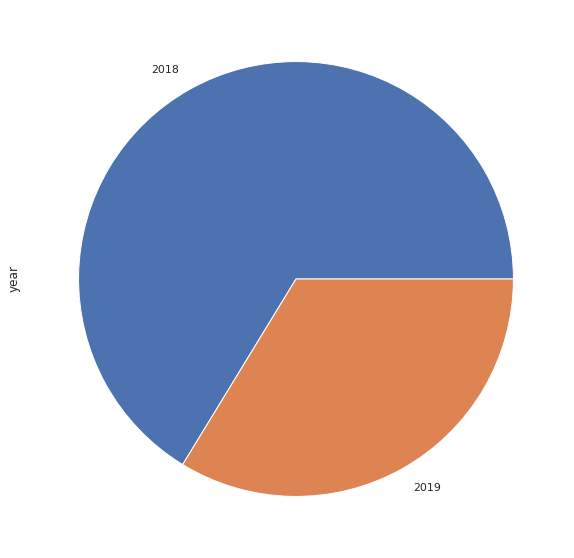

In [ ]:
# Check GPS logs per year
gps_df["year"].value_counts().plot(kind="pie", figsize=(10,10))

In [ ]:
# To simplify the analysis we will select the GPS logs of 2018.
gps_df_2018 = gps_df[gps_df["year"] == 2018]
gps_df_2019 = gps_df[gps_df["year"] == 2019]
gps_count_2018 = gps_df_2018["id"].value_counts().reset_index()
gps_count_2019 = gps_df_2019["id"].value_counts().reset_index()

In [ ]:
fig = px.bar(gps_count_2018, 
             x="index", y="id",
             text_auto=".2s",
             color="id",
             template="simple_white",
             labels={
                 "id": "GPS logs",
                 "index": "Users"
             })

fig.update_layout(title_text = "GPS logs per User (2018)")

fig.show()

In [ ]:
fig = px.bar(gps_count_2019, 
             x="index", y="id",
             text_auto=".2s",
             color="id",
             template="simple_white",
             labels={
                 "id": "GPS logs",
                 "index": "Users"
             })

fig.update_layout(title_text = "GPS logs per User (2019)")

fig.show()

In [ ]:
## Count the data by day, hour and weekday

hourly_ride_data = gps_df_2018.groupby(['day','hour','weekday'])["datetime"].count()
hourly_ride_data = hourly_ride_data.reset_index()
hourly_ride_data = hourly_ride_data.rename(columns = {'datetime':'ride_count'})
hourly_ride_data.head()

,day,hour,weekday,ride_count
0,4,7,Sunday,176
1,4,8,Sunday,454
2,4,9,Sunday,448
3,4,10,Sunday,438
4,4,11,Sunday,405


In [ ]:
# Get the average rides from the ride count per weekday and hour.
hourly_avg = hourly_ride_data.groupby(["weekday", "hour"])['ride_count'].mean()
hourly_avg = hourly_avg.reset_index()
hourly_avg = hourly_avg.rename(columns={"ride_count":"avg_rides"})
hourly_avg.head()

,weekday,hour,avg_rides
0,Friday,0,585.5
1,Friday,1,664.0
2,Friday,2,654.5
3,Friday,3,662.0
4,Friday,4,682.5


In [ ]:
fig = px.area(hourly_avg, 
              x="hour", y="avg_rides", 
              color='weekday',
              labels={"avg_rides": "Average Rides",
                      "hour": "Hour",
                      "weekday": "Days"},
              template="simple_white")

fig.update_layout(height=500, width=1250, 
                  title_text="Hourly Average Rides per Day", 
                  title_x = 0.5)
fig.update_xaxes(tickmode='linear')
fig.show()

# **Stay Point Processing**


<div style="text-align: right">Stay Point Detection is the process of compressing the data points by identifying the location to which the gps logs stayed for a significant amount of time. In order to do this, we have to create a cluster zone by setting a maximum distance and minimum time interval from the initial point. The distance of the successing gps points should be less than from the maximum distance and greater than from the minimum time interval. The gps points that will agreed in this condition will be added to the cluster zone. Once the distance of current gps point exceeds against the maximum distance, the iteration will end for a while. The centroid of accumulated gps point will be computed together with time interval of the initial point and last point inside the cluster zone. Once the computation is successfully done, the current point from the last iteration will become the next initial point.</div>





In [ ]:
# Limiting the GPS points inclusive in Metro Manila only
cutted_df = gps_df_2018.loc[(gps_df_2018["lon"]>=120.9) & (gps_df_2018["lon"]<=121.195)]
cutted_df = cutted_df.loc[(gps_df_2018["lat"]>=14.45) & (gps_df_2018["lat"]<=14.79)]

In [ ]:
# Visualizing the GPS logs
fig = px.scatter(cutted_df,
                x='lon', 
                y='lat',             
                width=800,
                height=800,
                marginal_x="histogram", marginal_y="histogram",
                opacity=0.7,
                template="simple_white")

fig.update_layout(title_text="Raw coverage of GPS logs (2018)")
fig.show()

In [ ]:
class StayPoint_Identification():
  def __init__(self, data, cutoff_distance, minimum_time):   
    self.gps_data = data
    self.cutoff_distance = cutoff_distance
    self.minimum_time = minimum_time
    self.staypoints = self.StayPoint()
    self.staypoints_df = self.to_dataframe()

  def Centroid(self, latitude, longitude):
    """
    This function computes the centroid of the
    collected coordinates inside the cut-off distance
    and exceeds the minimum time interval.
    
    input:
      latitude: list
      longitude: list
    output:
      centroid: float
    """
    centroid_latitude = sum(latitude)/len(latitude)
    centroid_longitude = sum(longitude)/len(longitude)
    lat, lon = centroid_latitude, centroid_longitude
    return lat, lon

  def Radian(self, point):
    return float(point) * math.pi/180.0
  
  def Haversine_Distance(self, current_lat, current_lon, next_lat, next_lon):
    '''
    This function computes distance between two
    GPS points in km
    '''
    radius = 6371
    phi1 = self.Radian(current_lat)
    phi2 = self.Radian(next_lat)
    delta_phi = phi2 - phi1
    delta_lambda = self.Radian(next_lon) - self.Radian(current_lon)
    alpha = sin(delta_phi / 2) ** 2 + cos(phi1) * cos(phi2) * sin(delta_lambda/2) **2
    beta_distance = 2 * asin(sqrt(alpha))
    haversine_distance = radius * beta_distance
    return haversine_distance

  def StayPoint(self):
    """
    This function compress the data points by identifying 
    if the coordinates agreed to the set parameters such as
    cutoff_distance and minimum_time.

    output: tuple-list
    """
    trajectories = self.gps_data[["datetime", "lat", "lon"]].to_numpy()
    arrive_time = []
    leave_time = []
    center_latitude = []
    center_longitude = []

    current_index = 0
    while current_index < trajectories.shape[0]:
      moving_index = current_index + 1
      while moving_index < trajectories.shape[0]:
        current_point = (trajectories[current_index][0], 
                          trajectories[current_index][1],
                          trajectories[current_index][2])
        try:
          moving_point = (trajectories[moving_index][0], 
                        trajectories[moving_index][1],
                        trajectories[moving_index][2])
        except IndexError:
          pass

        # Compute Haversine Distance
        lats, lons = [current_point[1]], [current_point[2]] # Initial points
        threshold_distance = self.Haversine_Distance(current_point[1], 
                                                     current_point[2],
                                                     moving_point[1], 
                                                     moving_point[2])
        
        if threshold_distance <= self.cutoff_distance:
          print(f"Threshold distance {threshold_distance} is inside the Cut-off Distance {self.cutoff_distance}.")
          initial_time = current_point[0]
          final_time = moving_point[0]
          time_interval = abs(final_time - initial_time)
          time_interval_s = time_interval / np.timedelta64(1, 's')
          print(f"Moving time: {final_time}, Initial time: {initial_time}")
          print(f"Computed time interval: {time_interval_s}.")
          if time_interval_s >= self.minimum_time:
              print(f"{current_index} {moving_index} Time interval: {time_interval_s} exceeds the minimum time {self.minimum_time}.")
              # The present moving point will be added to the list.
              lats.append(moving_point[1])
              lons.append(moving_point[2])
              
          # Move to the next point.
          moving_index+=1
        elif threshold_distance >= self.cutoff_distance:
          # present moving point is outside the cut-off distance.
          print("Adding of GPS points is terminated.")
          print(f"Final time: {final_time}, Initial time: {initial_time}")
          break
        else:
          # Do nothing.
          pass

      # Process mean coordinates 
      latitude_, longitude_ = self.Centroid(lats, lons)

      # Append Output lists
      print(f"Final time: {final_time}, Initial time: {initial_time}")
      center_latitude.append(latitude_)
      center_longitude.append(longitude_)
      arrive_time.append(initial_time)
      leave_time.append(final_time)

      # current index will move to the next moving index.
      current_index = moving_index
    
    return center_latitude, center_longitude, arrive_time, leave_time

  def to_dataframe(self):
    """
    Converts the staypoint from tuple-list to dataframe.
    """
    latitude, longitude, arrive_time, leave_time = self.staypoints
    # .T transposes the 4 by n array output of staypoints()
    gps_centers = pd.DataFrame([latitude, longitude, arrive_time, leave_time]).T
    gps_centers.rename(columns={
        0: "latitude",
        1: "longitude",
        2: "arrive_time",
        3: "leave_time"}, inplace=True)
    
    gps_centers["time_interval (s)"] = abs(gps_centers["leave_time"] - gps_centers["arrive_time"]) / np.timedelta64(1, 's')
    final_gps_centers = gps_centers[gps_centers["time_interval (s)"] >= self.minimum_time]
    return final_gps_centers

In [ ]:
# This processing will take at least 5-6 mins in a stable connection.
gps_staypoints = StayPoint_Identification(cutted_df, 2, 240)
gps_centers = gps_staypoints.staypoints_df
gps_centers.head()

Streaming output truncated to the last 5000 lines.
Moving time: 2018-03-18 05:30:01, Initial time: 2018-03-14 22:54:27
Computed time interval: 282934.0.
173909 175921 Time interval: 282934.0 exceeds the minimum time 240.
Threshold distance 0.0094300868872553 is inside the Cut-off Distance 2.
Moving time: 2018-03-18 05:32:01, Initial time: 2018-03-14 22:54:27
Computed time interval: 283054.0.
173909 175922 Time interval: 283054.0 exceeds the minimum time 240.
Threshold distance 0.0094300868872553 is inside the Cut-off Distance 2.
Moving time: 2018-03-18 05:34:01, Initial time: 2018-03-14 22:54:27
Computed time interval: 283174.0.
173909 175923 Time interval: 283174.0 exceeds the minimum time 240.
Threshold distance 0.0094300868872553 is inside the Cut-off Distance 2.
Moving time: 2018-03-18 05:36:01, Initial time: 2018-03-14 22:54:27
Computed time interval: 283294.0.
173909 175924 Time interval: 283294.0 exceeds the minimum time 240.
Threshold distance 0.0094300868872553 is inside the C

,latitude,longitude,arrive_time,leave_time,time_interval (s)
0,14.588641,121.18521,2018-03-08 09:48:41,2018-03-09 09:22:01,84800.0
1,14.612987,121.154904,2018-03-09 09:27:38,2018-03-09 11:43:43,8165.0
2,14.590647,121.188318,2018-03-09 11:57:51,2018-03-12 14:05:14,266843.0
3,14.580381,121.172614,2018-03-12 14:09:06,2018-03-12 18:25:45,15399.0
4,14.593028,121.193443,2018-03-12 18:54:50,2018-03-12 14:31:37,15793.0


In [ ]:
# Saving the the gps centers
gps_centers.to_csv(r"/content/gdrive/My Drive/Data Science Portfolio/Mobility Analysis/gps_centers.csv", sep=",", encoding="latin-1")

# Read CSV
gps_centers = pd.read_csv(r"/content/gdrive/My Drive/Data Science Portfolio/Mobility Analysis/gps_centers.csv", sep=",", encoding="latin-1", index_col=False)
gps_centers.shape

(9155, 6)

The GPS points was squeeze from 300K data points to 9155 data points.

In [ ]:
# Let's visualize the distribution of stay points
fig = px.scatter(gps_centers, 
                 x="longitude", y="latitude", 
                 marginal_x="histogram", marginal_y="histogram",
                 width=800,
                 height=900,
                 template="simple_white")
fig.update_layout(title_text="GPS Stay Point Distribution (2018)")
fig.show()

After the Stay point processing, the data is largely downsize to scalable level. We can notice, that the peak gps coordinates is around 600-700 gps point. 


In [ ]:
# Let's visualize the gps points with their respective time interval.
fig = px.scatter_mapbox(gps_centers,
                        lat='latitude', 
                        lon='longitude',             
                        width=800,
                        height=800,
                        color="time_interval (s)",
                        # opacity=0.5,
                        zoom=10).update_layout(mapbox_style="carto-positron")

fig.update_layout(title_text="Time Interval of GPS Stay Points (2018)")
fig.show()

# **Cluster Analysis**
In this part, we will cluster the stay points to identify if we can gain any observable insights from similarity, proximity, and location.

In [ ]:
# Cast the coordinates to float datatype
gps_centers["latitude"] = gps_centers["latitude"].astype(float)
gps_centers["longitude"] = gps_centers["longitude"].astype(float)

X = gps_centers[["latitude", "longitude"]].to_numpy()

# **Elbow Method**

Elbow method is one of the basic neighborhood optimization technique for K-Means Clustering. In this way, we can identify what is the minimum and maximum K-cluster we can use for grouping the gps points.

/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change fro

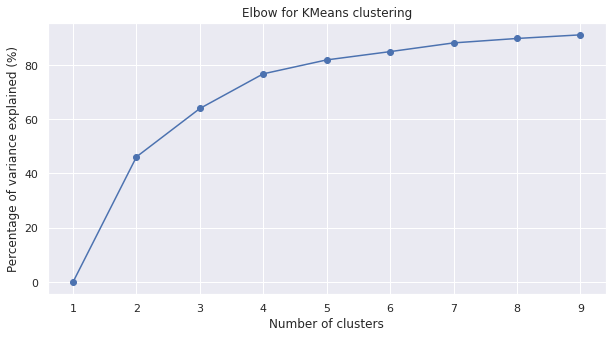

In [ ]:
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist, pdist
Ks = range(1, 10)
kmean = [KMeans(n_clusters=i).fit(X) for i in Ks]

def plot_elbow(kmean, X):
    centroids = [k.cluster_centers_ for k in kmean]
    D_k = [cdist(X, center, 'euclidean') for center in centroids]
    dist = [np.min(D,axis=1) for D in D_k]

    # Total with-in sum of square
    wcss = [sum(d**2) for d in dist]
    tss = sum(pdist(X)**2)/X.shape[0]
    bss = tss-wcss

    plt.subplots(nrows=1, ncols=1, figsize=(10,5))
    ax = plt.subplot(1, 1, 1)
    ax.plot(Ks, bss/tss*100, 'bo-')
    plt.grid(True)
    plt.xlabel('Number of clusters')
    plt.ylabel('Percentage of variance explained (%)')
    plt.title('Elbow for KMeans clustering')
    plt.show()

plot_elbow(kmean, X)

The elbow method suggested a optimum cluster of 2, 3, or 4

# **K-Means Clustering**

In this part, we will conduct K-Means clustering to group the stay points in order to identify the divisions with respect to its location. 

K-Means Clustering is a unsupervised machine learning algorithm that groups the data using similarity and dissimilarity computations in 2-dimensional approach. In general, K-Means uses the [Euclidean Distance Equation](https://science.howstuffworks.com/math-concepts/distance-formula.htm) to conduct its clustering.


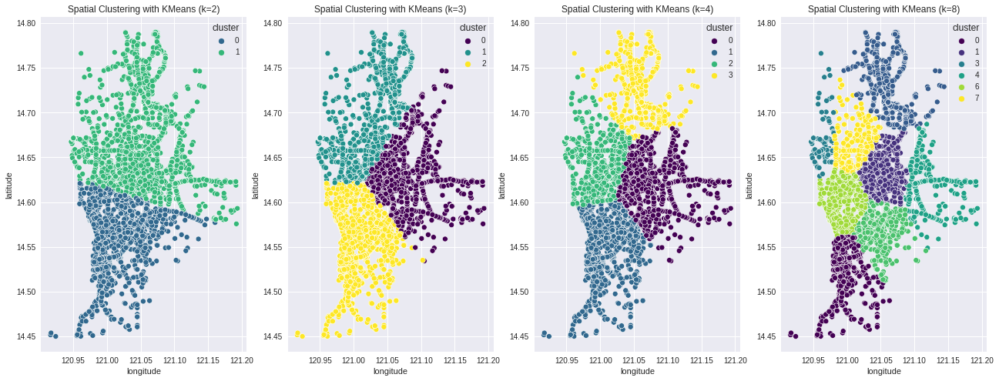

In [ ]:
k = [2, 3, 4, 8] # 8 cluster to see the difference from optimum values.
n = len(k)
plt.subplots(nrows=1, ncols=4, figsize=(22,8))

for i in range(n):
    est = kmean[k[i]-1]
    gps_centers['cluster'] = est.predict(X).tolist()
    ax = plt.subplot(1, 4, i+1)
    ax.set_title("Spatial Clustering with KMeans (k={})".format(k[i]))
    sns.scatterplot(data=gps_centers, 
                    x="longitude", y="latitude",
                    hue="cluster",
                    palette="viridis")

K-Means Clustering tends to effectively group the gps points in its optimum values.

- Cluster 2 group the stay points to North and South.
- Cluster 3 & 4 group the stay points *similar* to the division of the 4 districts of Metro Manila.
- While Cluster 8, breaks the previous cluster and group the stay points into more granular groups.

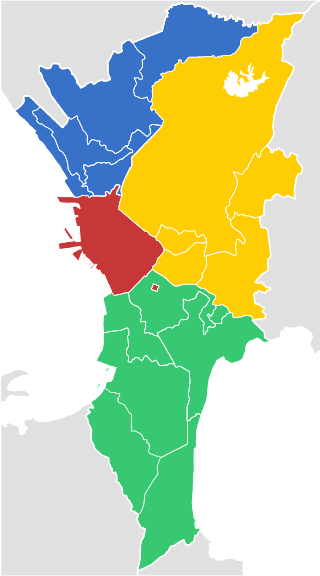

In [ ]:
# Implement K-Means where K=4
gps_kmeans_4 = gps_centers.copy()
est = kmean[4]
gps_kmeans_4['cluster'] = est.predict(X).tolist()
gps_kmeans_4[["latitude", "longitude", "cluster"]].head()

,latitude,longitude,cluster
0,14.588641,121.185210,4
1,14.612987,121.154904,4
2,14.590647,121.188318,4
3,14.580381,121.172614,4
4,14.593028,121.193443,4


# **Density-based Clustering**

The next clustering algorithm that we will try is the DBSCAN or Density-Based Spatial Clustering of Applications with Noise. Unlike K-Means, DBSCAN don't need to initialize a cluster number to identify the data points included in its cluster. DBSCAN needs the initialization the maximum distance between points (eps or epsilon), and minimum data points in a cluster (min_sample). DBSCAN considers the effect of spherical distance between two points, so I think it compatible to GPS points. In addition to this, DBSCAN has an anomaly detection scheme which classifies all data points that do not fall to any cluster as a noise.

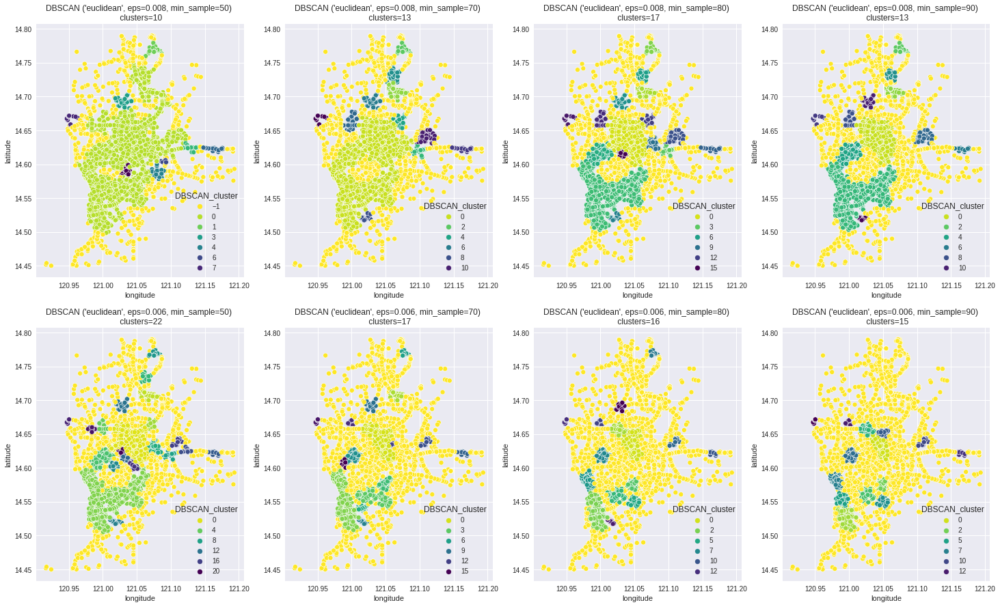

In [ ]:
eps = [0.008, 0.006]   # unit: latitude/longitude
min_sample = [50, 70, 80, 90]
n1, n2 = len(eps), len(min_sample)
plt.subplots(nrows=n1, ncols=n2, figsize=(25, 15))

for i in range(n1):
    for j in range(n2):
        est = DBSCAN(eps=eps[i], min_samples=min_sample[j], metric="euclidean").fit(X)
        gps_centers['DBSCAN_cluster'] = est.labels_.tolist()
        cluster_count = len(gps_centers['DBSCAN_cluster'].unique())
        ax = plt.subplot(n1, n2, n2*i+j+1)
        ax.set_title(f"DBSCAN ('euclidean', eps={eps[i]}, min_sample={min_sample[j]}) \n clusters={cluster_count}")
        sns.scatterplot(data=gps_centers, 
                    x="longitude", y="latitude",
                    hue="DBSCAN_cluster",
                    palette="viridis_r")

- In this output, we can see that DBSCAN can group the data points in a more specific locations. Because of this, the clusters tends to become very distant from each other in order to maintain its compactness. Since it has an outlier detection schemes, most of the data points are classified as noise (cluster 0).

- I'm considering the last cluster (Cluster 15) the *visually optimum cluster*, which has the following characteristics:
  - specific cluster location.
  - similarity of cluster coverage.
  - different cluster distances

In general,

1. K-Means Clustering can perfectly draw the division between data points but lacks the capability to locate specific areas from its cluster.
2. DBSCAN can draw specific areas from its cluster but its hyperparameters (epsilon and min_samples) are sensitive that it becomes bias to Noise classification.